## 1. Exploration

In the exploration phase, the the train set of the first fold is used to assess both features and targets.

An exploratory analysis is performed using descriptive statistics and data visualization. Features are grouped according to their column names (chroma cens, chroma cqt, chroma stft, mfcc, rmse, spectral bandwidth, spectral centroid, spectral contrast, spectral rolloff, tonnetz, zcr).

1. For each target, an overview of a subsample of the data is visualized using an interactive PCA plot.
2. Mean, median, standard deviation, and quantiles are reported for features and targets.
3. The distributions of the features are visualized with violin plots. The distributions of the targets are visualized with histograms, on which a density estimate is plotted.
4. The features are assessed on covariance and correlation using heatmaps.
5. Missing data is reported for each variable and assessed on randomness. Duplicates are reported as well.

(Choice to conceptualize listens as popularity.)

### Setup

In [10]:
import pandas as pd
import numpy as np
from sklearn.decomposition import PCA
from sklearn.cluster import KMeans
from scipy.stats import pearsonr

import matplotlib.pyplot as plt
from matplotlib import colors
import seaborn as sns
import plotly.express as px

sns.set_theme()

General source: https://musicinformationretrieval.com/index.html
Feature extractor: https://librosa.org/doc/main/feature.html

The features are divided into groups, and each relate to certain measures for the midi data a music file consists in. The main groups and sub groups are:
- Chroma: "Chroma-based features, which are also referred to as "pitch class profiles", are a powerful tool for analyzing music whose pitches can be meaningfully categorized (often into twelve categories) and whose tuning approximates to the equal-tempered scale. One main property of chroma features is that they capture harmonic and melodic characteristics of music, while being robust to changes in timbre and instrumentation." [wiki](https://en.wikipedia.org/wiki/Chroma_feature)
    - Cens
    - Cqt
    - Sft
- Mfcc: "In sound processing, the mel-frequency cepstrum (MFC) is a representation of the short-term power spectrum of a sound, based on a linear cosine transform of a log power spectrum on a nonlinear mel scale of frequency." [wiki](https://en.wikipedia.org/wiki/Mel-frequency_cepstrum)
- Rmse: 
- Spectral:
    - Bandwith
    - Centroid
    - Contrast
    - Rollof
- Tonnetz:
- Zcr:

All these features are aggregated. Since a feature is normally computed per second, to provide a feature per song is done with aggregation.

In [2]:
class Feats():
    """
    Each feature has a first name, optionally a second name, a statistic and a number.
    This class allows to group feautures according to these aspects or combinations of these aspects.
    Each method produces a list of feature names or a list of lists of feature names.
    """

    def __init__(self, csv):
        self.fts = pd.read_csv(csv, dtype={'n':"string"})
        self.fts = self.fts.fillna('')

    def format(self, select):
        return select.apply(lambda x: '_'.join(x).replace('__', '_'), axis=1).tolist()

    def all(self):
        select = self.fts.copy()
        return self.format(select)

    def first(self):
        select = self.fts.copy()
        select = select.loc[select['n']=='01']
        return self.format(select)

    def min(self):
        select = self.fts.copy()
        select = select.loc[select['stat']=='min']
        return self.format(select)
    
    def max(self):
        select = self.fts.copy()
        select = select.loc[select['stat']=='max']
        return self.format(select)

    def median(self):
        select = self.fts.copy()
        select = select.loc[select['stat']=='median']
        return self.format(select)

    def mean(self):
        select = self.fts.copy()
        select = select.loc[select['stat']=='mean']
        return self.format(select)
    
    def std(self):
        select = self.fts.copy()
        select = select.loc[select['stat']=='std']
        return self.format(select)

    def skew(self):
        select = self.fts.copy()
        select = select.loc[select['stat']=='skew']
        return self.format(select)

    def kurtosis(self):
        select = self.fts.copy()
        select = select.loc[select['stat']=='kurtosis']
        return self.format(select)

    def per_nns(self):
        """
        List of lists per name1, name2, stat, per name1, name2.
        """
        select = self.fts.copy()
        select = [[self.format(grp2) for idx2, grp2 in grp.groupby(by=['stat'], sort=False)] for idx, grp in select.groupby(by=['name1', 'name2'])]
        return select
    
    def per_sn(self):
        """
        List of lists per stat, n. 
        """
        select = self.fts.copy()
        select = [[self.format(grp2) for idx2, grp2 in grp.groupby(by=['n'], sort=False)] for idx, grp in select.groupby(by=['stat'], sort=False)]
        return select

fts = Feats('features.csv')

In [3]:
# Read data
df = pd.read_csv('data/fold/f1_train.csv',  parse_dates=['release'])

### 1.1 Dimensionality reduction
To get a first idea of the features, for each targ the data is binned and visualized using PCA dimensionality reduction. For each target, values are binned, to create comparable categories. With this visualization, no real groups can be distinguished. This suggests that in the feature space ... . 

The plot is interactive, such that different bins can be compared.
(Tested both without binning, creating a continuous plot, and with. Chose to present with binning for interpretability and the option to show and hide datapoints from a specific bin with plotly.)

Source: https://plotly.com/python/pca-visualization/

Kmeans: https://towardsdatascience.com/k-means-clustering-with-scikit-learn-6b47a369a83c

#### Popularity

In [7]:
# PCA

bins = [0, 10, 100, 1000, 10000, 100000, 1000000]
labels = ["1s", "10s", "100s", "1000s", "10.000s", "100.000s"]

df['popularity_bins'] = pd.cut(df['popularity'], bins=bins, labels=labels, right=False)
df['popularity_bins'] = df['popularity_bins'].cat.add_categories('unknown').fillna('unknown')

pca = PCA(n_components=2)
components = pca.fit_transform(df[fts.all()])

fig = px.scatter(components, x=0, y=1, color=df['popularity_bins'])
fig.show()

In [11]:
# PCA 3D

bins = [0, 10, 100, 1000, 10000, 100000, 1000000]
labels = ["1s", "10s", "100s", "1000s", "10.000s", "100.000s"]

df['popularity_bins'] = pd.cut(df['popularity'], bins=bins, labels=labels, right=False)
df['popularity_bins'] = df['popularity_bins'].cat.add_categories('unknown').fillna('unknown')

pca = PCA(n_components=3)
components = pca.fit_transform(df[fts.all()])

fig = px.scatter_3d(components, x=0, y=1, color=df['popularity_bins'])
fig.show()

#### Release

In [8]:
bins = [1900, 1960, 1970, 1980, 1990, 2000, 2010, 2020, 2022]
labels = ['<1960', "'60s", "'70s", "'80s", "'90s", "'00s", "'10s", ">2020"]

df['release_bins'] = pd.cut(df['release'].dt.year, bins=bins, labels=labels, right=False)
df['release_bins'] = df['release_bins'].cat.add_categories('unknown').fillna('unknown')

pca = PCA(n_components=2)
components = pca.fit_transform(X=df[fts.all()])

fig = px.scatter(components, x=0, y=1, color=df['release_bins'])
fig.show()

### 1.2 Statistics

#### Features

In [9]:
print(df[fts.first()].describe())

       chroma_cens_min_01  chroma_cens_max_01  chroma_cens_median_01  \
count        68207.000000        68207.000000           68207.000000   
mean             0.009448            0.622458               0.248691   
std              0.032296            0.086240               0.095213   
min              0.000000            0.040076               0.000000   
25%              0.000000            0.571424               0.200554   
50%              0.000000            0.641602               0.243299   
75%              0.000000            0.684443               0.297389   
max              0.579809            1.000000               0.854536   

       chroma_cens_mean_01  chroma_cens_std_01  chroma_cens_skew_01  \
count         68207.000000        68207.000000         68207.000000   
mean              0.257112            0.125576             0.253301   
std               0.081399            0.038908             0.844521   
min               0.000006            0.000446            -9.470790

#### Targets

In [11]:
# Targets
print("Popularity")
print(df.popularity.describe())
print('')
print("Release")
print(df.release.describe(datetime_is_numeric=True))

Popularity
count     68207.000000
mean       2304.720249
std        7860.428354
min           0.000000
25%         292.000000
50%         765.000000
75%        2021.000000
max      543252.000000
Name: popularity, dtype: float64

Release
count                            45029
mean     2011-04-01 10:57:43.208154880
min                1902-01-01 00:00:00
25%                2009-04-15 00:00:00
50%                2011-12-29 00:00:00
75%                2014-04-08 00:00:00
max                2021-03-01 00:00:00
Name: release, dtype: object


### 1.3 Distributions

#### Features
The visualization of the distributions of the feautures are grouped by `first_name, second_name` per row, and a `statistic` per column. This allows to compare the features per `number`. Observations:
- For all `chroma` features, there is not much difference between feautures of different `number`, only in the outliers. This would suggest that selecting or sampling one feature per `chroma_[second_name]_statistic_number` suffices.
- For the `mffc` features, the `number` feautures seem to converge, to a certain mean, with the first `number` feature differing the most from other features.
- For the `tonnetz` features, for the `statistic` features mean, median, min, max, and std, `number` 3 and 4 differs from the other `number` features.

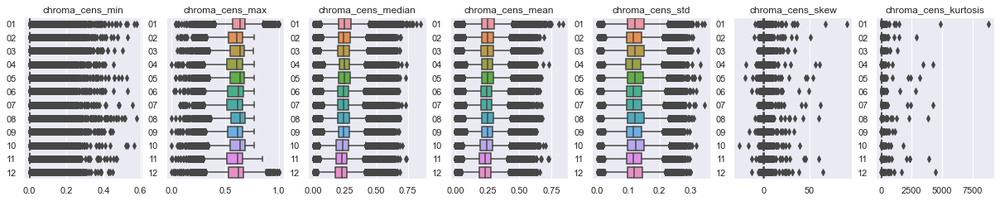

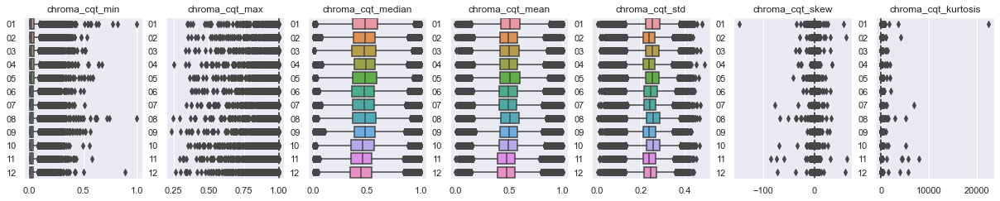

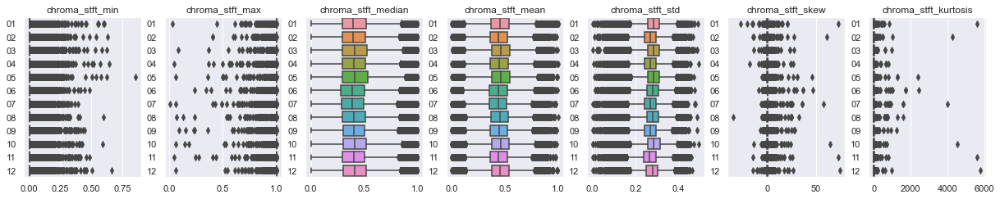

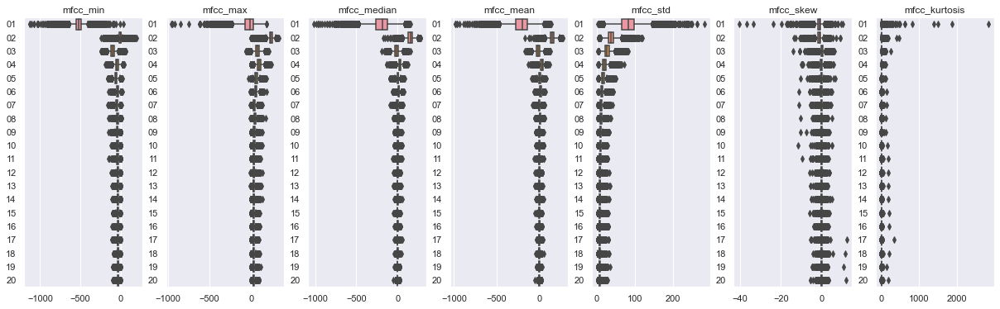

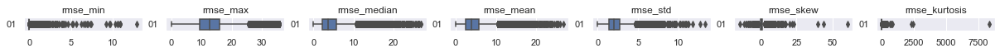

...

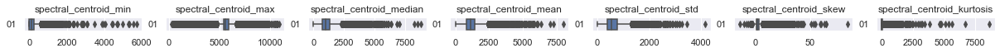

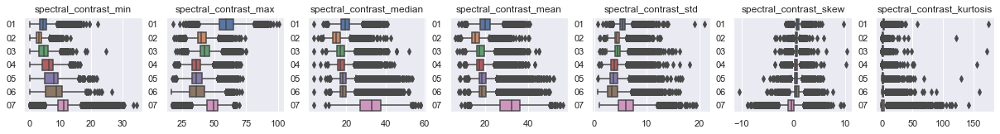

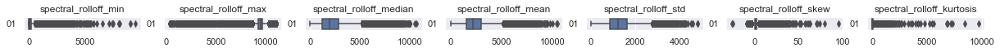

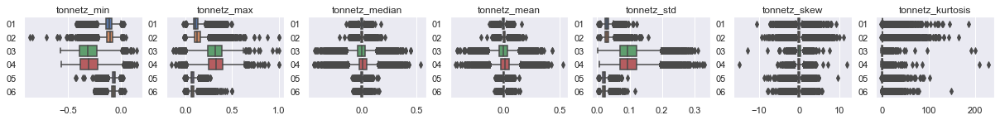

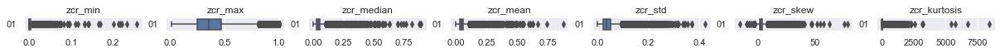

In [12]:
fts_groups = fts.per_nns()

for fnn_group in fts_groups:
    n = len(fnn_group[0])
    c, r = 7, 1
    fig, axs = plt.subplots(ncols=c, nrows=r, figsize=(3*c, 3*r*0.1*n))

    for i in range(c):
        fnns_group = fnn_group[i]
        ax = sns.boxplot(data=df[fnns_group], orient='h', ax=axs[i])

        title = "_".join(fnns_group[0].split("_")[:-1])
        ax.set(title=title)
        y_ticks = [n.split('_')[-1] for n in fnns_group]
        ax.set_yticklabels(y_ticks)
    
fig;

#### Targets

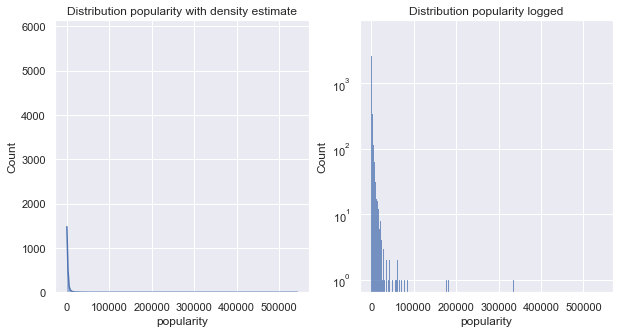

In [13]:
fig, axs = plt.subplots(ncols=2, figsize=(10,5))

ax1 = sns.histplot(data=df, x="popularity", kde=True, ax=axs[0])
ax1.set(title="Distribution popularity with density estimate")

ax2 = sns.histplot(data=df, x="popularity", log_scale=(False, True), ax=axs[1])
ax2.set(title="Distribution popularity logged")

fig;

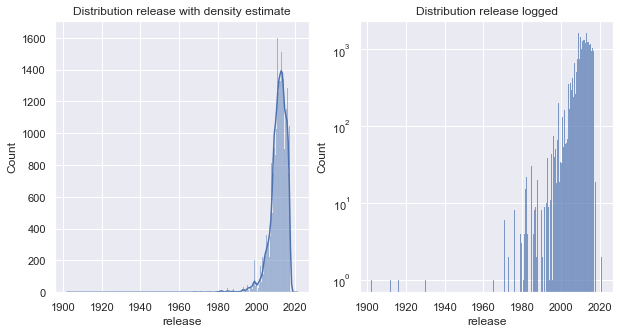

In [14]:
fig, axs = plt.subplots(ncols=2, figsize=(10,5))

ax1 = sns.histplot(data=df, x="release", kde=True, ax=axs[0])
ax1.set(title="Distribution release with density estimate")

ax2 = sns.histplot(data=df, x="release", log_scale=(False, True), ax=axs[1])
ax2.set(title="Distribution release logged")

fig;

### 1.4 Covariance and correlation
The boxplots have shown how the distribution within certain feature groups are very similar. Similarity amongst feature groups can be further assessed by plotting them amongst each other, and calculating the correlation efficient (pearson).

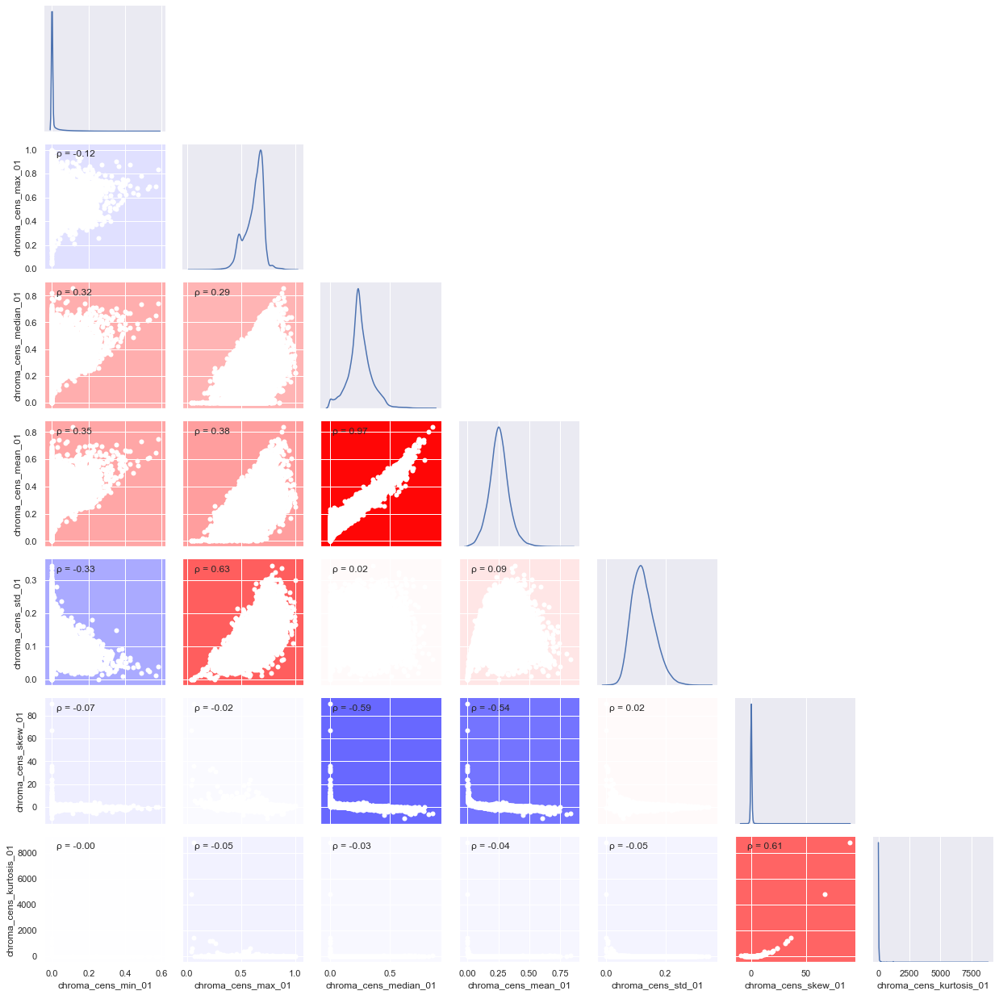

In [15]:
# per name_1, name_2, stat, first

cm = plt.cm.bwr
cnorm = colors.Normalize(vmin=-1, vmax=1)
smap = plt.cm.ScalarMappable(norm=cnorm, cmap=cm)

def corrfunc(x, y, ax=None, **kws):
    """Plot the correlation coefficient in the top left hand corner of a plot."""
    r, _ = pearsonr(x, y)
    ax = ax or plt.gca()
    ax.annotate(f'ρ = {r:.2f}', xy=(.1, .9), xycoords=ax.transAxes)
    ax.set_facecolor(smap.to_rgba(r))

fig = sns.PairGrid(df[fts.first()[:7]], diag_sharey=False, corner=True)
fig.map_diag(sns.kdeplot)
fig.map_lower(sns.scatterplot, color = 'w', linewidth = 0)
fig.map_lower(corrfunc)

fig;

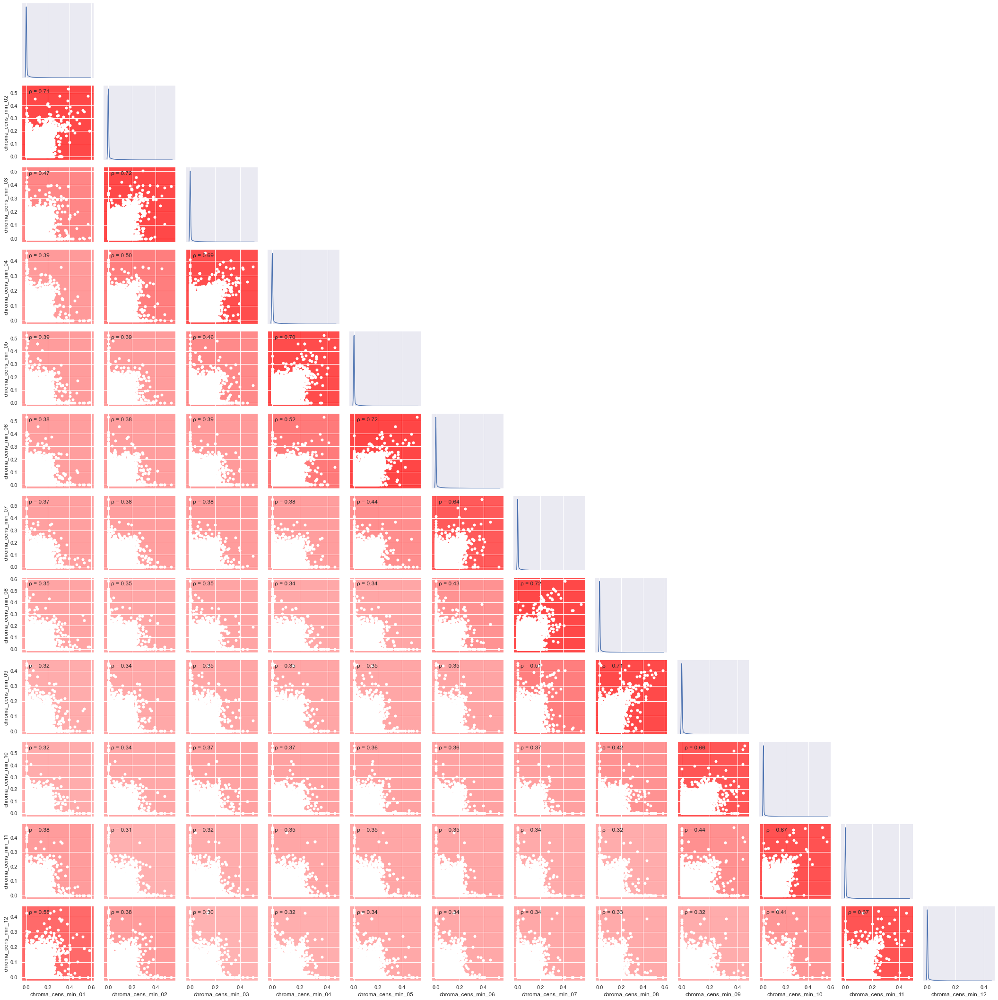

In [16]:
# per name_1, name_2, stat, n

cm = plt.cm.bwr
cnorm = colors.Normalize(vmin=-1, vmax=1)
smap = plt.cm.ScalarMappable(norm=cnorm, cmap=cm)

def corrfunc(x, y, ax=None, **kws):
    """Plot the correlation coefficient in the top left hand corner of a plot."""
    r, _ = pearsonr(x, y)
    ax = ax or plt.gca()
    ax.annotate(f'ρ = {r:.2f}', xy=(.1, .9), xycoords=ax.transAxes)
    ax.set_facecolor(smap.to_rgba(r))

fig = sns.PairGrid(df[fts.all()[0:12]], diag_sharey=False, corner=True)
fig.map_diag(sns.kdeplot)
fig.map_lower(sns.scatterplot, color = 'w', linewidth = 0)
fig.map_lower(corrfunc)

fig;

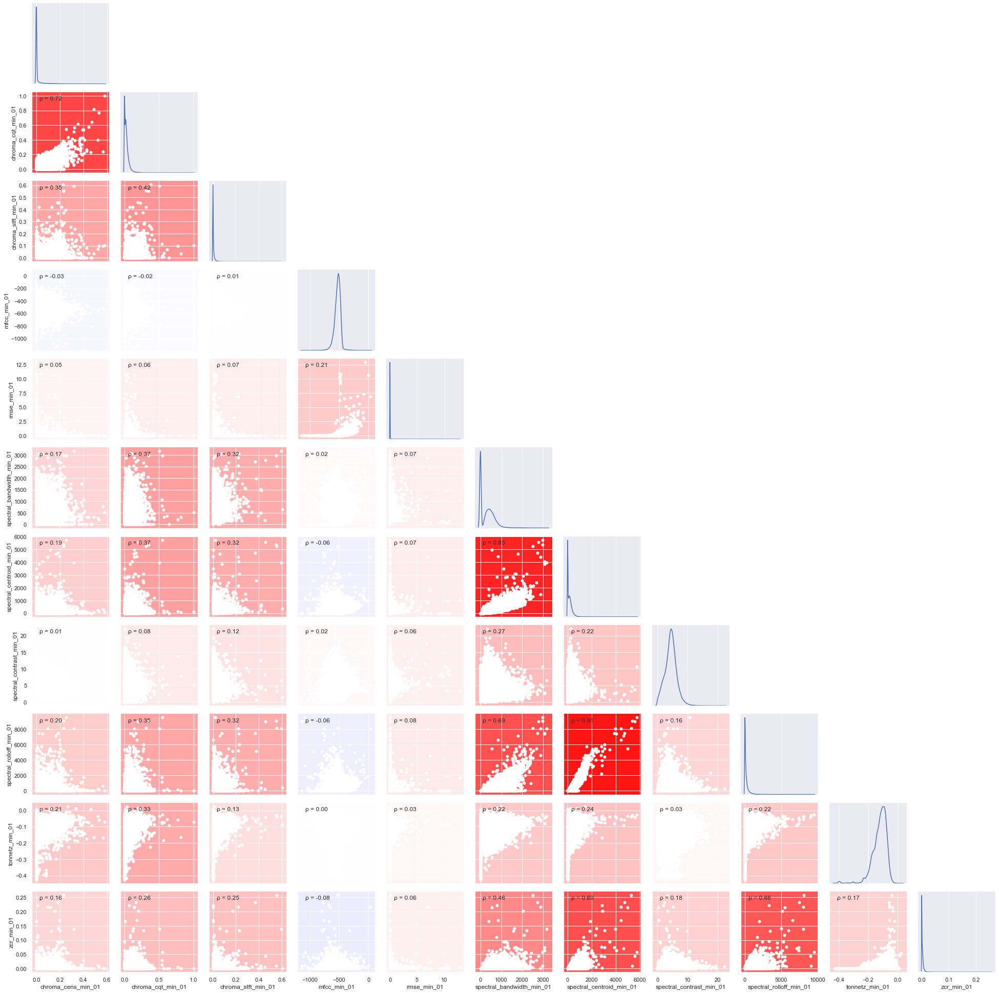

In [17]:
# stat, first

cm = plt.cm.bwr
cnorm = colors.Normalize(vmin=-1, vmax=1)
smap = plt.cm.ScalarMappable(norm=cnorm, cmap=cm)

def corrfunc(x, y, ax=None, **kws):
    """Plot the correlation coefficient in the top left hand corner of a plot."""
    r, _ = pearsonr(x, y)
    ax = ax or plt.gca()
    ax.annotate(f'ρ = {r:.2f}', xy=(.1, .9), xycoords=ax.transAxes)
    ax.set_facecolor(smap.to_rgba(r))

fig = sns.PairGrid(df[fts.per_sn()[0][0]], diag_sharey=False, corner=True)
fig.map_diag(sns.kdeplot)
fig.map_lower(sns.scatterplot, color = 'w', linewidth = 0)
fig.map_lower(corrfunc)

fig;

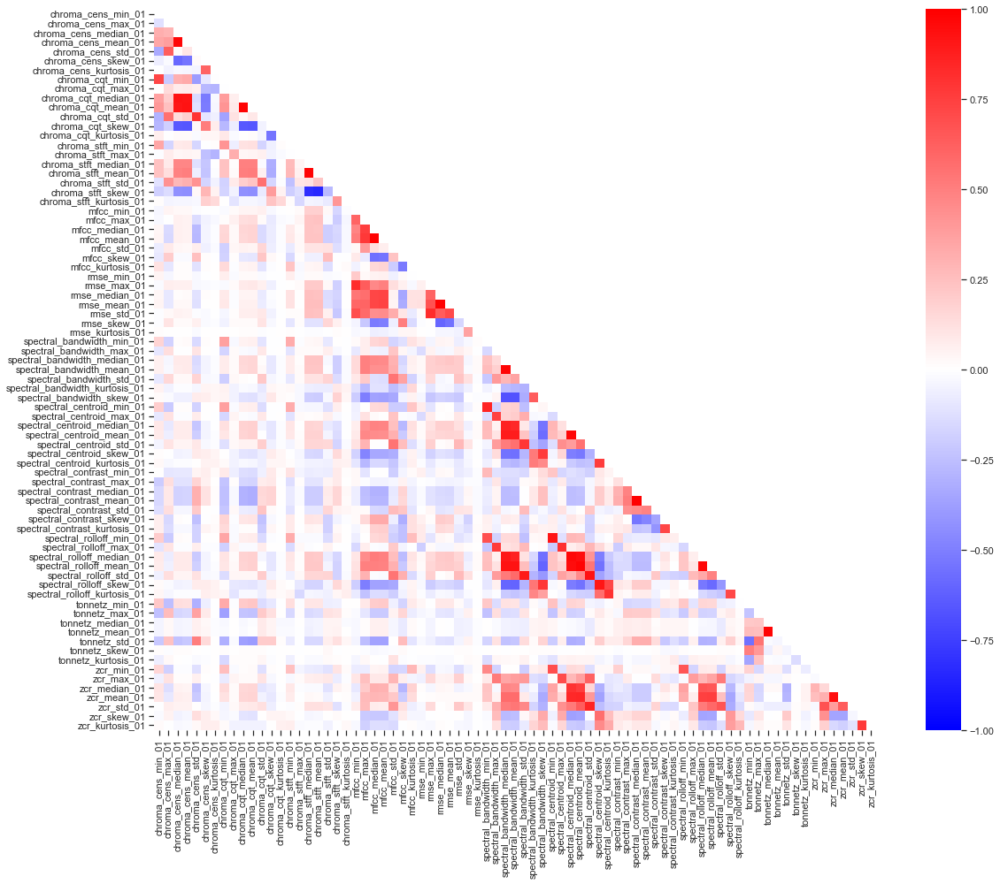

In [18]:
corr = df[fts.first()].corr()

mask = np.zeros_like(corr)
mask[np.triu_indices_from(mask)] = True
with sns.axes_style("white"):
    fig, ax = plt.subplots(figsize=(20, 15))
    ax = sns.heatmap(corr, mask=mask, vmin=-1, vmax=1, cmap='bwr', xticklabels=True, yticklabels=True, square=True)
    ax.tick_params(left=True, bottom=True)

fig;

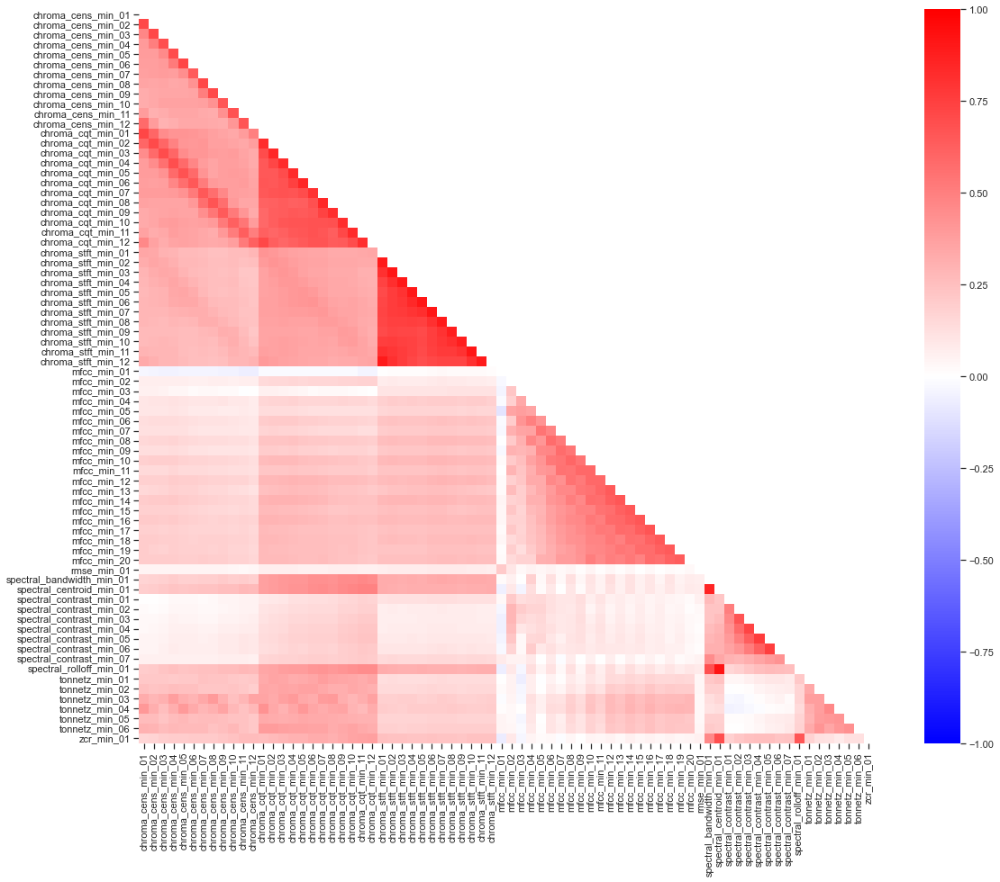

In [19]:
corr = df[fts.min()].corr()

mask = np.zeros_like(corr)
mask[np.triu_indices_from(mask)] = True
with sns.axes_style("white"):
    fig, ax = plt.subplots(figsize=(20, 15))
    ax = sns.heatmap(corr, mask=mask, vmin=-1, vmax=1, cmap='bwr', xticklabels=True, yticklabels=True, square=True)
    ax.tick_params(left=True, bottom=True)

fig;

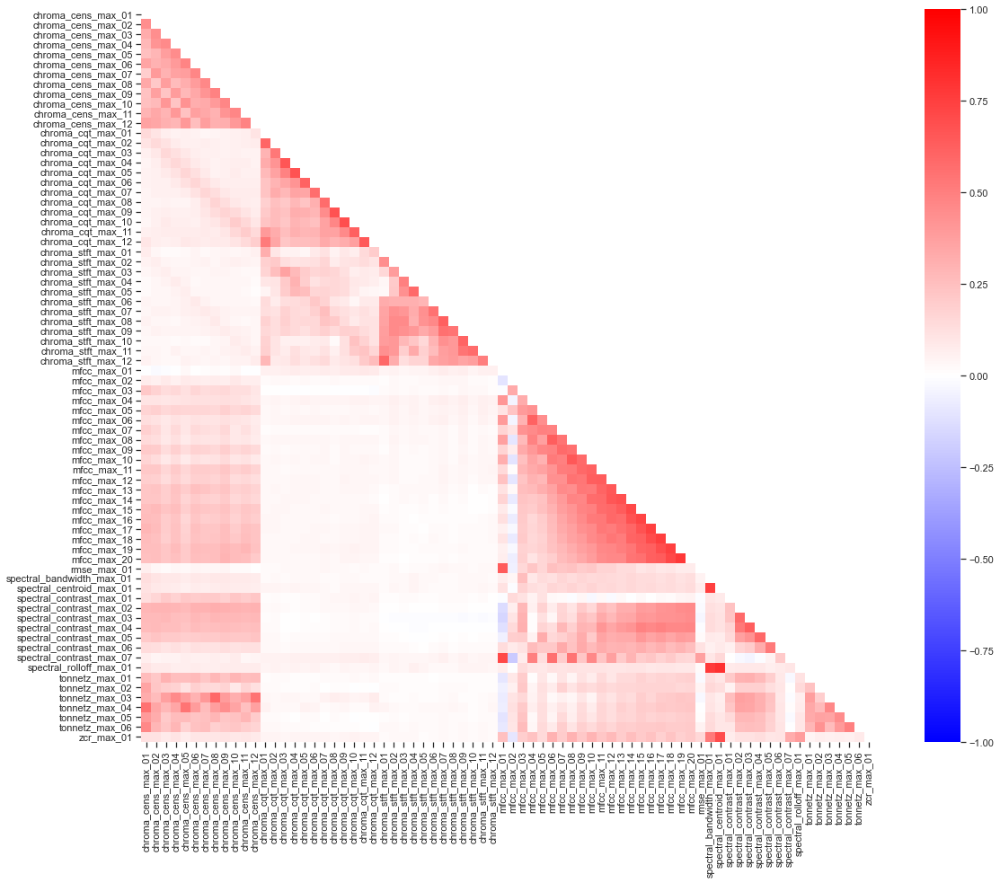

In [20]:
corr = df[fts.max()].corr()

mask = np.zeros_like(corr)
mask[np.triu_indices_from(mask)] = True
with sns.axes_style("white"):
    fig, ax = plt.subplots(figsize=(20, 15))
    ax = sns.heatmap(corr, mask=mask, vmin=-1, vmax=1, cmap='bwr', xticklabels=True, yticklabels=True, square=True)
    ax.tick_params(left=True, bottom=True)

fig;

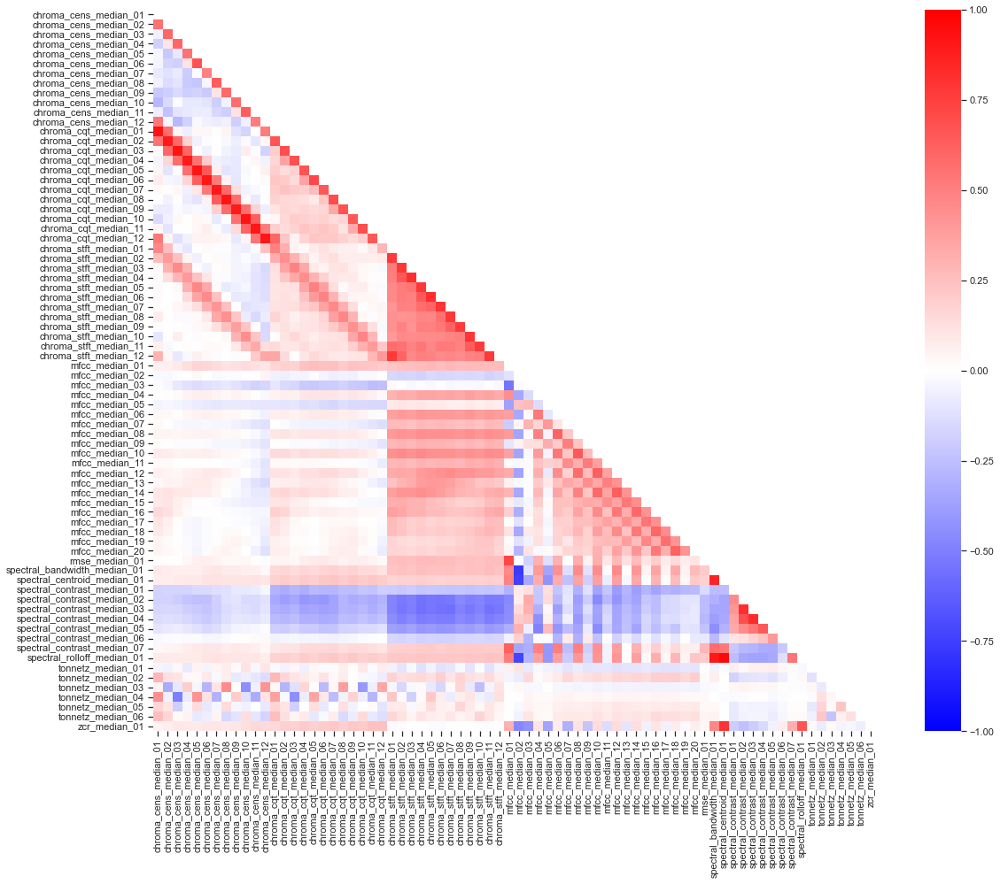

In [21]:
corr = df[fts.median()].corr()

mask = np.zeros_like(corr)
mask[np.triu_indices_from(mask)] = True
with sns.axes_style("white"):
    fig, ax = plt.subplots(figsize=(20, 15))
    ax = sns.heatmap(corr, mask=mask, vmin=-1, vmax=1, cmap='bwr', xticklabels=True, yticklabels=True, square=True)
    ax.tick_params(left=True, bottom=True)

fig;

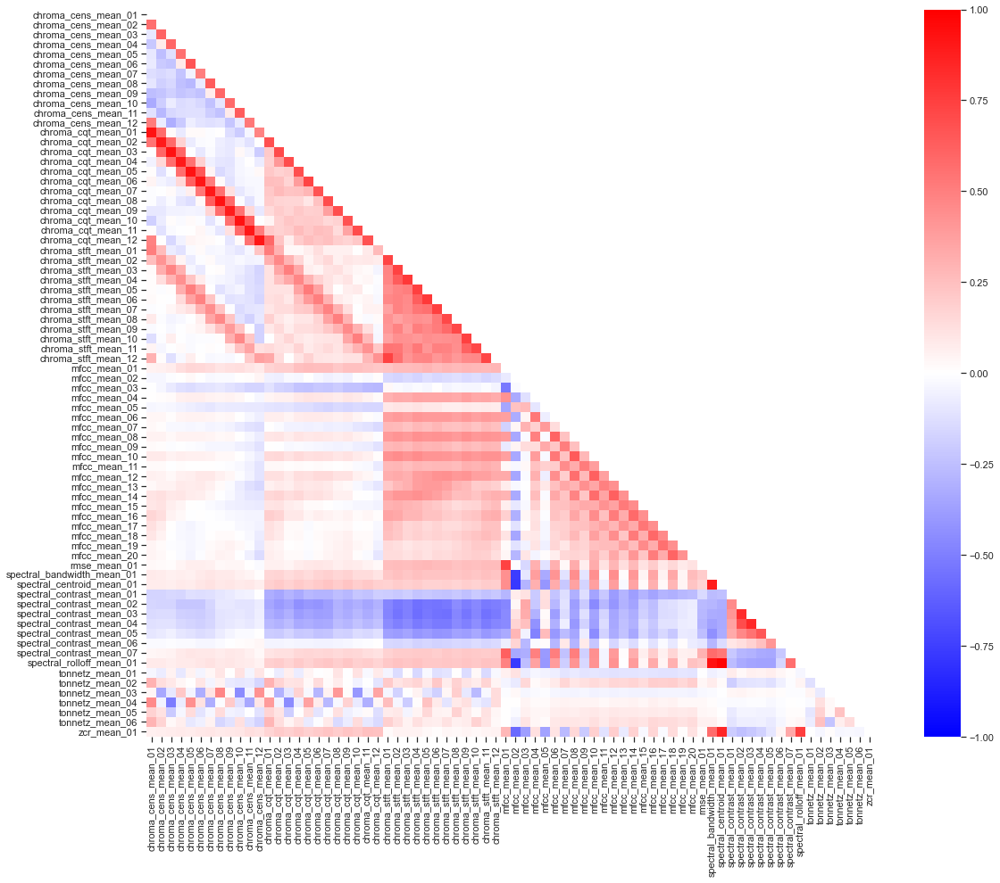

In [22]:
corr = df[fts.mean()].corr()

mask = np.zeros_like(corr)
mask[np.triu_indices_from(mask)] = True
with sns.axes_style("white"):
    fig, ax = plt.subplots(figsize=(20, 15))
    ax = sns.heatmap(corr, mask=mask, vmin=-1, vmax=1, cmap='bwr', xticklabels=True, yticklabels=True, square=True)
    ax.tick_params(left=True, bottom=True)

fig;

In [ ]:
# Correlation with target

corrs = [(column, pearsonr(X[column], y)[0]) for column in X]
corrs = sorted(corrs, key=lambda x: x[1], reverse=True)
for cor in corrs:
    print(f'{cor[0]}: {cor[1]}')

### 1.5 Missing values and duplicated values

In [23]:
total = df.shape[0]

na = df[fts.all()].isna().sum().sum()
print(f'NA values features: {na} of {total}')
na = df.popularity.isna().sum().sum()
print(f'NA values popularity target: {na} of {total}')
na = df.release.isna().sum().sum()
print(f'NA values release target: {na} of {total}')

dup = df[df[fts.all()].duplicated()].shape[0]
print(f'Duplicate features: {dup} of {total}')
dup = df[df.duplicated()].shape[0]
print(f'Duplicates: {dup} of {total}')

NA values features: 0 of 68207
NA values popularity target: 0 of 68207
NA values release target: 23178 of 68207
Duplicate features: 946 of 68207
Duplicates: 3 of 68207


Analysis of the release target shows that, while there is more data available on created than on release, the difference is too large, such that it is not reliable to infer from this metadata. No other metadata is available to infer.

In [24]:
df_meta = pd.read_csv('data/all/metadata.csv')

na = df_meta[['album_date_created', 'album_date_released']].isna()

ff = na.loc[(na['album_date_released']==False) & (na['album_date_created']==False)].shape[0]
ft = na.loc[(na['album_date_released']==False) & (na['album_date_created']==True)].shape[0]
tf = na.loc[(na['album_date_released']==True) & (na['album_date_created']==False)].shape[0]
tt = na.loc[(na['album_date_released']==True) & (na['album_date_created']==True)].shape[0]

print(f'\
               | created != na | created = na \n\
released != na |     {ff}     |      {ft}    \n\
released = na  |     {tf}     |      {tt}    \n\
')

               | created != na | created = na 
released != na |     70294     |      0    
released = na  |     32751     |      3529    



In [25]:
df_year = df_meta[['album_date_created', 'album_date_released']].copy()
df_year['created'] = df_year['album_date_created'].dt.year
df_year['released'] = df_year['album_date_released'].dt.year
df_year['track'] = df_year['track_date_created'].dt.year
df_year['diff_days'] = df_year['album_date_created'] - df_year['album_date_released']
df_year['diff_year'] = df_year['created'] - df_year['released']

fig, axs = plt.subplots(ncols=1, figsize=(10,5))

sns.histplot(data=df_year, x="diff_year", kde=True);

fig;

AttributeError: Can only use .dt accessor with datetimelike values